In [0]:
from fastai import *
from fastai.vision import *

In [0]:
from fastai.vision.models.unet import _get_sfs_idxs, model_sizes, hook_outputs

In [0]:
class LateralUpsampleMerge(nn.Module):
    "Merge the features coming from the downsample path (in `hook`) with the upsample path."
    def __init__(self, ch, ch_lat, hook):
        super().__init__()
        self.hook = hook
        self.conv_lat = conv2d(ch_lat, ch, ks=1, bias=True)
    
    def forward(self, x):
        return self.conv_lat(self.hook.stored) + F.interpolate(x, self.hook.stored.shape[-2:], mode='nearest')

In [0]:
class ResBlock(nn.Module):
    def __init__(self, nf):
        super().__init__()
        self.conv1 = conv_layer(nf,nf)
        self.conv2 = conv_layer(nf,nf)
        self.conv=conv_layer(nf, nf, bias=True, norm_type=None) 
        
    def forward(self, x):
      x=self.conv(x)
      return x + self.conv2(self.conv1(x))

In [0]:
class RetinaNet(nn.Module):
    "Implements RetinaNet from https://arxiv.org/abs/1708.02002"
    def __init__(self, encoder:nn.Module, n_classes, final_bias=0., chs=256, n_anchors=9, flatten=True):
        super().__init__()
        self.n_classes,self.flatten = n_classes,flatten
        imsize = (256,256)
        sfs_szs = model_sizes(encoder, size=imsize)
        sfs_idxs = list(reversed(_get_sfs_idxs(sfs_szs)))
        self.sfs = hook_outputs([encoder[i] for i in sfs_idxs])
        self.encoder = encoder
        self.c5top5 = conv2d(sfs_szs[-1][1], chs, ks=1, bias=True)
        self.c5top6 = conv2d(sfs_szs[-1][1], chs, stride=2, bias=True)
        self.p6top7 = nn.Sequential(nn.ReLU(), conv2d(chs, chs, stride=2, bias=True))
        self.merges = nn.ModuleList([LateralUpsampleMerge(chs, sfs_szs[idx][1], hook) 
                                     for idx,hook in zip(sfs_idxs[-2:-4:-1], self.sfs[-2:-4:-1])])
        self.smoothers = nn.ModuleList([conv2d(chs, chs, 3, bias=True) for _ in range(3)])
        self.classifier = self._head_subnet(n_classes, n_anchors, final_bias, chs=chs)
        self.box_regressor = self._head_subnet(4, n_anchors, 0., chs=chs)
        self.res=conv2d(chs,chs,3,stride=1)
        
    def _head_subnet(self, n_classes, n_anchors, final_bias=0., n_conv=4, chs=256):
        "Helper function to create one of the subnet for regression/classification."
        #layers = [ResBlock(chs) for _ in range(n_conv)]
        layers = [conv_layer(chs, chs, bias=True, norm_type=None) for _ in range(n_conv)]
        layers += [conv2d(chs, n_classes * n_anchors, bias=True)]
        layers[-1].bias.data.zero_().add_(final_bias)
        layers[-1].weight.data.fill_(0)
        return nn.Sequential(*layers)
    
    def _apply_transpose(self, func, p_states, n_classes):
        #Final result of the classifier/regressor is bs * (k * n_anchors) * h * w
        #We make it bs * h * w * n_anchors * k then flatten in bs * -1 * k so we can contenate
        #all the results in bs * anchors * k (the non flatten version is there for debugging only)
        if not self.flatten: 
            sizes = [[p.size(0), p.size(2), p.size(3)] for p in p_states]
            return [func(p).permute(0,2,3,1).view(*sz,-1,n_classes) for p,sz in zip(p_states,sizes)]
        else:
            return torch.cat([func(p).permute(0,2,3,1).contiguous().view(p.size(0),-1,n_classes) for p in p_states],1)
    
    def forward(self, x):
        c5 = self.encoder(x)
        p_states = [self.c5top5(c5.clone()), self.c5top6(c5)]
        p_states.append(self.p6top7(p_states[-1]))
        for merge in self.merges: p_states = [merge(p_states[0])] + p_states
        for i, smooth in enumerate(self.smoothers[:3]):
            p_states[i] = smooth(p_states[i])
        return [self._apply_transpose(self.classifier, p_states, self.n_classes), 
                self._apply_transpose(self.box_regressor, p_states, 4),
                [[p.size(2), p.size(3)] for p in p_states]]
    
    def __del__(self):
        if hasattr(self, "sfs"): self.sfs.remove()

In [0]:
def create_grid(size):
    "Create a grid of a given `size`."
    H, W = size if is_tuple(size) else (size,size)
    grid = FloatTensor(H, W, 2)
    linear_points = torch.linspace(-1+1/W, 1-1/W, W) if W > 1 else tensor([0.])
    grid[:, :, 1] = torch.ger(torch.ones(H), linear_points).expand_as(grid[:, :, 0])
    linear_points = torch.linspace(-1+1/H, 1-1/H, H) if H > 1 else tensor([0.])
    grid[:, :, 0] = torch.ger(linear_points, torch.ones(W)).expand_as(grid[:, :, 1])
    return grid.view(-1,2)

def show_anchors(ancs, size):
    _,ax = plt.subplots(1,1, figsize=(5,5))
    ax.set_xticks(np.linspace(-1,1, size[1]+1))
    ax.set_yticks(np.linspace(-1,1, size[0]+1))
    ax.grid()
    ax.scatter(ancs[:,1], ancs[:,0]) #y is first
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.set_xlim(-1,1)
    ax.set_ylim(1,-1) #-1 is top, 1 is bottom
    for i, (x, y) in enumerate(zip(ancs[:, 1], ancs[:, 0])): ax.annotate(i, xy = (x,y))


def create_anchors(sizes, ratios, scales, flatten=True):
    "Create anchor of `sizes`, `ratios` and `scales`."
    aspects = [[[s*math.sqrt(r), s*math.sqrt(1/r)] for s in scales] for r in ratios]
    aspects = torch.tensor(aspects).view(-1,2)
    anchors = []
    for h,w in sizes:
        #4 here to have the anchors overlap.
        sized_aspects = 4 * (aspects * torch.tensor([2/h,2/w])).unsqueeze(0)
        base_grid = create_grid((h,w)).unsqueeze(1)
        n,a = base_grid.size(0),aspects.size(0)
        ancs = torch.cat([base_grid.expand(n,a,2), sized_aspects.expand(n,a,2)], 2)
        anchors.append(ancs.view(h,w,a,4))
    return torch.cat([anc.view(-1,4) for anc in anchors],0) if flatten else anchors



In [0]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_color = 12
cmap = get_cmap(num_color)
color_list = [cmap(float(x)) for x in range(num_color)]

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [0]:
def show_boxes(boxes):
    "Show the `boxes` (size by 4)"
    _, ax = plt.subplots(1,1, figsize=(5,5))
    ax.set_xlim(-1,1)
    ax.set_ylim(1,-1)
    for i, bbox in enumerate(boxes):
        bb = bbox.numpy()
        rect = [bb[1]-bb[3]/2, bb[0]-bb[2]/2, bb[3], bb[2]]
        draw_rect(ax, rect, color=color_list[i%num_color])
        draw_text(ax, [bb[1]-bb[3]/2,bb[0]-bb[2]/2], str(i), color=color_list[i%num_color])

def activ_to_bbox(acts, anchors, flatten=True):
    "Extrapolate bounding boxes on anchors from the model activations."
    if flatten:
        acts.mul_(acts.new_tensor([[0.1, 0.1, 0.2, 0.2]])) #Can't remember where those scales come from, but they help regularize
        centers = anchors[...,2:] * acts[...,:2] + anchors[...,:2]
        sizes = anchors[...,2:] * torch.exp(acts[...,:2])
        return torch.cat([centers, sizes], -1)
    else: return [activ_to_bbox(act,anc) for act,anc in zip(acts, anchors)]
    return res
def cthw2tlbr(boxes):
    "Convert center/size format `boxes` to top/left bottom/right corners."
    top_left = boxes[:,:2] - boxes[:,2:]/2
    bot_right = boxes[:,:2] + boxes[:,2:]/2
    return torch.cat([top_left, bot_right], 1)

def intersection(anchors, targets):
    "Compute the sizes of the intersections of `anchors` by `targets`."
    ancs, tgts = cthw2tlbr(anchors), cthw2tlbr(targets)
    a, t = ancs.size(0), tgts.size(0)
    ancs, tgts = ancs.unsqueeze(1).expand(a,t,4), tgts.unsqueeze(0).expand(a,t,4)
    top_left_i = torch.max(ancs[...,:2], tgts[...,:2])
    bot_right_i = torch.min(ancs[...,2:], tgts[...,2:])
    sizes = torch.clamp(bot_right_i - top_left_i, min=0) 
    return sizes[...,0] * sizes[...,1]
def IoU_values(anchors, targets):
    "Compute the IoU values of `anchors` by `targets`."
    inter = intersection(anchors, targets)
    anc_sz, tgt_sz = anchors[:,2] * anchors[:,3], targets[:,2] * targets[:,3]
    union = anc_sz.unsqueeze(1) + tgt_sz.unsqueeze(0) - inter
    return inter/(union+1e-8)
def match_anchors(anchors, targets, match_thr=0.5, bkg_thr=0.4):
    "Match `anchors` to targets. -1 is match to background, -2 is ignore."
    matches = anchors.new(anchors.size(0)).zero_().long() - 2
    if targets.numel() == 0: return matches
    ious = IoU_values(anchors, targets)
    vals,idxs = torch.max(ious,1)
    matches[vals < bkg_thr] = -1
    matches[vals > match_thr] = idxs[vals > match_thr]
    #Overwrite matches with each target getting the anchor that has the max IoU.
    #vals,idxs = torch.max(ious,0)
    #If idxs contains repetition, this doesn't bug and only the last is considered.
    #matches[idxs] = targets.new_tensor(list(range(targets.size(0)))).long()
    return matches
def tlbr2cthw(boxes):
    "Convert top/left bottom/right format `boxes` to center/size corners."
    center = (boxes[:,:2] + boxes[:,2:])/2
    sizes = boxes[:,2:] - boxes[:,:2]
    return torch.cat([center, sizes], 1)

def bbox_to_activ(bboxes, anchors, flatten=True):
    "Return the target of the model on `anchors` for the `bboxes`."
    if flatten:
        t_centers = (bboxes[...,:2] - anchors[...,:2]) / anchors[...,2:] 
        t_sizes = torch.log(bboxes[...,2:] / anchors[...,2:] + 1e-8) 
        return torch.cat([t_centers, t_sizes], -1).div_(bboxes.new_tensor([[0.1, 0.1, 0.2, 0.2]]))
    else: return [activ_to_bbox(act,anc) for act,anc in zip(acts, anchors)]
    return res
def encode_class(idxs, n_classes):
    target = idxs.new_zeros(len(idxs), n_classes).float()
    mask = idxs != 0
    i1s = LongTensor(list(range(len(idxs))))
    target[i1s[mask],idxs[mask]-1] = 1
    return target



In [0]:
class RetinaNetFocalLoss(nn.Module):
    
    def __init__(self, gamma:float=2., alpha:float=0.25,  pad_idx:int=0, scales:Collection[float]=None, 
                 ratios:Collection[float]=None, reg_loss:LossFunction=F.smooth_l1_loss):
        super().__init__()
        self.gamma,self.alpha,self.pad_idx,self.reg_loss = gamma,alpha,pad_idx,reg_loss
        self.scales = ifnone(scales, [1,2**(-1/3), 2**(-2/3)])
        self.ratios = ifnone(ratios, [1/2,1,2])
        
    def _change_anchors(self, sizes:Sizes) -> bool:
        if not hasattr(self, 'sizes'): return True
        for sz1, sz2 in zip(self.sizes, sizes):
            if sz1[0] != sz2[0] or sz1[1] != sz2[1]: return True
        return False
    
    def _create_anchors(self, sizes:Sizes, device:torch.device):
        self.sizes = sizes
        self.anchors = create_anchors(sizes, self.ratios, self.scales).to(device)
    
    def _unpad(self, bbox_tgt, clas_tgt):
        i = torch.min(torch.nonzero(clas_tgt-self.pad_idx))
        return tlbr2cthw(bbox_tgt[i:]), clas_tgt[i:]-1+self.pad_idx
    
    def _focal_loss(self, clas_pred, clas_tgt):
        encoded_tgt = encode_class(clas_tgt, clas_pred.size(1))
        ps = torch.sigmoid(clas_pred.detach())
        weights = encoded_tgt * (1-ps) + (1-encoded_tgt) * ps
        alphas = (1-encoded_tgt) * self.alpha + encoded_tgt * (1-self.alpha)
        weights.pow_(self.gamma).mul_(alphas)
        clas_loss = F.binary_cross_entropy_with_logits(clas_pred, encoded_tgt, weights, reduction='sum')
        return clas_loss
        
    def _one_loss(self, clas_pred, bbox_pred, clas_tgt, bbox_tgt):
        bbox_tgt, clas_tgt = self._unpad(bbox_tgt, clas_tgt)
        matches = match_anchors(self.anchors, bbox_tgt)
        bbox_mask = matches>=0
        if bbox_mask.sum() != 0:
            bbox_pred = bbox_pred[bbox_mask]
            bbox_tgt = bbox_tgt[matches[bbox_mask]]
            bb_loss = self.reg_loss(bbox_pred, bbox_to_activ(bbox_tgt, self.anchors[bbox_mask]))
        else: bb_loss = 0.
        matches.add_(1)
        clas_tgt = clas_tgt + 1
        clas_mask = matches>=0
        clas_pred = clas_pred[clas_mask]
        clas_tgt = torch.cat([clas_tgt.new_zeros(1).long(), clas_tgt])
        clas_tgt = clas_tgt[matches[clas_mask]]
        return bb_loss + self._focal_loss(clas_pred, clas_tgt)/torch.clamp(bbox_mask.sum(), min=1.)
    
    def forward(self, output, bbox_tgts, clas_tgts):
        clas_preds, bbox_preds, sizes = output
        if self._change_anchors(sizes): self._create_anchors(sizes, clas_preds.device)
        n_classes = clas_preds.size(2)
        return sum([self._one_loss(cp, bp, ct, bt)
                    for (cp, bp, ct, bt) in zip(clas_preds, bbox_preds, clas_tgts, bbox_tgts)])/clas_tgts.size(0)


In [0]:
class SigmaL1SmoothLoss(nn.Module):

    def forward(self, output, target):
        reg_diff = torch.abs(target - output)
        reg_loss = torch.where(torch.le(reg_diff, 1/9), 4.5 * torch.pow(reg_diff, 2), reg_diff - 1/18)
        return reg_loss.mean()


In [0]:
ratios = [1/2,1,2]
scales = [1,2**(-1/3), 2**(-2/3)]
#scales = [1,2**(1/3), 2**(2/3)] #for bigger size

In [0]:
def get_predictions(output, idx, detect_thresh=0.05):
    bbox_pred, scores, preds = process_output(output, idx, detect_thresh)
    if len(scores) == 0: return [],[],[]
    to_keep = nms(bbox_pred, scores)
    return bbox_pred[to_keep], preds[to_keep], scores[to_keep]
  
def compute_ap(precision, recall):
    "Compute the average precision for `precision` and `recall` curve."
    recall = np.concatenate(([0.], list(recall), [1.]))
    precision = np.concatenate(([0.], list(precision), [0.]))
    for i in range(len(precision) - 1, 0, -1):
        precision[i - 1] = np.maximum(precision[i - 1], precision[i])
    idx = np.where(recall[1:] != recall[:-1])[0]
    ap = np.sum((recall[idx + 1] - recall[idx]) * precision[idx + 1])
    return ap
def compute_class_AP(model, dl, n_classes, iou_thresh=0.5, detect_thresh=0.35, num_keep=100):
    tps, clas, p_scores = [], [], []
    classes, n_gts = LongTensor(range(n_classes)),torch.zeros(n_classes).long()
    with torch.no_grad():
        for input,target in progress_bar(dl):
            output = model(input)
            for i in range(target[0].size(0)):
                bbox_pred, preds, scores = get_predictions(output, i, detect_thresh)
                tgt_bbox, tgt_clas = unpad(target[0][i], target[1][i])
                if len(bbox_pred) != 0 and len(tgt_bbox) != 0:
                    ious = IoU_values(bbox_pred, tgt_bbox)
                    max_iou, matches = ious.max(1)
                    detected = []
                    for i in range_of(preds):
                        if max_iou[i] >= iou_thresh and matches[i] not in detected and tgt_clas[matches[i]] == preds[i]:
                            detected.append(matches[i])
                            tps.append(1)
                        else: tps.append(0)
                    clas.append(preds.cpu())
                    p_scores.append(scores.cpu())
                n_gts += (tgt_clas.cpu()[:,None] == classes[None,:]).sum(0)
    tps, p_scores, clas = torch.tensor(tps), torch.cat(p_scores,0), torch.cat(clas,0)
    fps = 1-tps
    idx = p_scores.argsort(descending=True)
    tps, fps, clas = tps[idx], fps[idx], clas[idx]
    aps = []
    #return tps, clas
    for cls in range(n_classes):
        tps_cls, fps_cls = tps[clas==cls].float().cumsum(0), fps[clas==cls].float().cumsum(0)
        if tps_cls.numel() != 0 and tps_cls[-1] != 0:
            precision = tps_cls / (tps_cls + fps_cls + 1e-8)
            recall = tps_cls / (n_gts[cls] + 1e-8)
            aps.append(compute_ap(precision, recall))
        else: aps.append(0.)
    return aps


In [0]:
def unpad(tgt_bbox, tgt_clas, pad_idx=0):
    i = torch.min(torch.nonzero(tgt_clas-pad_idx))
    return tlbr2cthw(tgt_bbox[i:]), tgt_clas[i:]-1+pad_idx

def _draw_outline(o:Patch, lw:int):
    "Outline bounding box onto image `Patch`."
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax:plt.Axes, b:Collection[int], color:str='white', text=None, text_size=14):
    "Draw bounding box on `ax`."
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    _draw_outline(patch, 4)
    if text is not None:
        patch = ax.text(*b[:2], text, verticalalignment='top', color=color, fontsize=text_size, weight='bold')
        _draw_outline(patch,1)

def nms(boxes, scores, thresh=0.3):
    idx_sort = scores.argsort(descending=True)
    boxes, scores = boxes[idx_sort], scores[idx_sort]
    to_keep, indexes = [], torch.LongTensor(range_of(scores))
    while len(scores) > 0:
        to_keep.append(idx_sort[indexes[0]])
        iou_vals = IoU_values(boxes, boxes[:1]).squeeze()
        mask_keep = iou_vals < thresh
        if len(mask_keep.nonzero()) == 0: break
        boxes, scores, indexes = boxes[mask_keep], scores[mask_keep], indexes[mask_keep]
    return LongTensor(to_keep)
def process_output(output, i, detect_thresh=0.25):
    clas_pred,bbox_pred,sizes = output[0][i], output[1][i], output[2]
    anchors = create_anchors(sizes, ratios, scales).to(clas_pred.device)
    bbox_pred = activ_to_bbox(bbox_pred, anchors)
    clas_pred = torch.sigmoid(clas_pred)
    detect_mask = clas_pred.max(1)[0] > detect_thresh
    bbox_pred, clas_pred = bbox_pred[detect_mask], clas_pred[detect_mask]
    bbox_pred = tlbr2cthw(torch.clamp(cthw2tlbr(bbox_pred), min=-1, max=1))    
    if clas_pred.numel() == 0: return [],[],[]
    scores, preds = clas_pred.max(1)
    return bbox_pred, scores, preds
def show_preds(img, output, idx, detect_thresh=0.35, classes=None, ax=None):
    bbox_pred, scores, preds = process_output(output, idx, detect_thresh)
    if len(scores) != 0:
        to_keep = nms(bbox_pred, scores)
        bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()
        t_sz = torch.Tensor([*img.size])[None].float()
        bbox_pred[:,:2] = bbox_pred[:,:2] - bbox_pred[:,2:]/2
        bbox_pred[:,:2] = (bbox_pred[:,:2] + 1) * t_sz/2
        bbox_pred[:,2:] = bbox_pred[:,2:] * t_sz
        bbox_pred = bbox_pred.long()
    if ax is None: fig, ax = plt.subplots(1,1)
    axs=img.show(ax=ax)
    for bbox, c, scr in zip(bbox_pred, preds, scores):
        txt = str(c.item()) if classes is None else classes[c.item()+1]
        draw_rect(ax, [bbox[1],bbox[0],bbox[3],bbox[2]], text=f'{txt} {scr:.2f}')
 
def show_results(learn, start=0, n=3, detect_thresh=0.35, figsize=(10,25)):
    x,y = next(iter(learn.data.valid_dl)) #one_batch(DatasetType.Valid, cpu=False)
    with torch.no_grad():
        z = learn.model.eval()(x)
    _,axs = plt.subplots(n, 1, figsize=figsize)
    for i in range(n):
        img,bbox = learn.data.valid_ds[start+i]
        #img.show(ax=axs[i,0], y=bbox)
        show_preds(img, z, start+i, detect_thresh=detect_thresh, classes=learn.data.classes, ax=axs[i])


In [0]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!kaggle datasets download -d kakods/gun-detection-final
!unzip gun-detection-final.zip

 99% 393M/399M [00:04<00:00, 80.6MB/s]
100% 399M/399M [00:04<00:00, 86.7MB/s]
Archive:  gun-detection-final.zip
   creating: guns/
   creating: guns/images/
  inflating: guns/images/2017-10-16_07-15-50_UTC.jpg  
  inflating: guns/images/2017-10-18_19-47-22_UTC.jpg  
  inflating: guns/images/2017-10-19_21-36-09_UTC.jpg  
  inflating: guns/images/2017-10-19_21-45-13_UTC.jpg  
  inflating: guns/images/2017-10-27_22-49-04_UTC.jpg  
  inflating: guns/images/2017-10-27_23-06-42_UTC.jpg  
  inflating: guns/images/2017-10-28_17-34-48_UTC.jpg  
  inflating: guns/images/2017-10-29_16-10-47_UTC.jpg  
  inflating: guns/images/2017-10-29_19-14-54_UTC.jpg  
  inflating: guns/images/2017-11-01_21-02-23_UTC.jpg  
  inflating: guns/images/2017-11-01_23-57-08_UTC.jpg  
  inflating: guns/images/2017-11-03_14-03-04_UTC.jpg  
  inflating: guns/images/2017-11-04_23-10-11_UTC.jpg  
  inflating: guns/images/2017-11-08_16-52-56_UTC.jpg  
  inflating: guns/images/2017-11-11_00-17-54_UTC.jpg  
  inflating: guns/

In [0]:
path=Path('guns')
images_trn,lbl_bbox_trn=get_annotations(path/'easy.json')
images,lbl_bbox=images_trn,lbl_bbox_trn
img2bbox = dict(zip(images, lbl_bbox))
get_y_func = lambda o:img2bbox[o.name]

In [0]:
def get_data(bs, size):
    src = ObjectItemList.from_folder(path/'images_easy')
    src =src.split_by_rand_pct(0.2,seed=2)   
    src = src.label_from_func(get_y_func)
    src = src.transform(get_transforms(), size=size, tfm_y=True)
    return src.databunch(path=path, bs=bs, collate_fn=bb_pad_collate)

In [0]:
data = get_data(64,128)

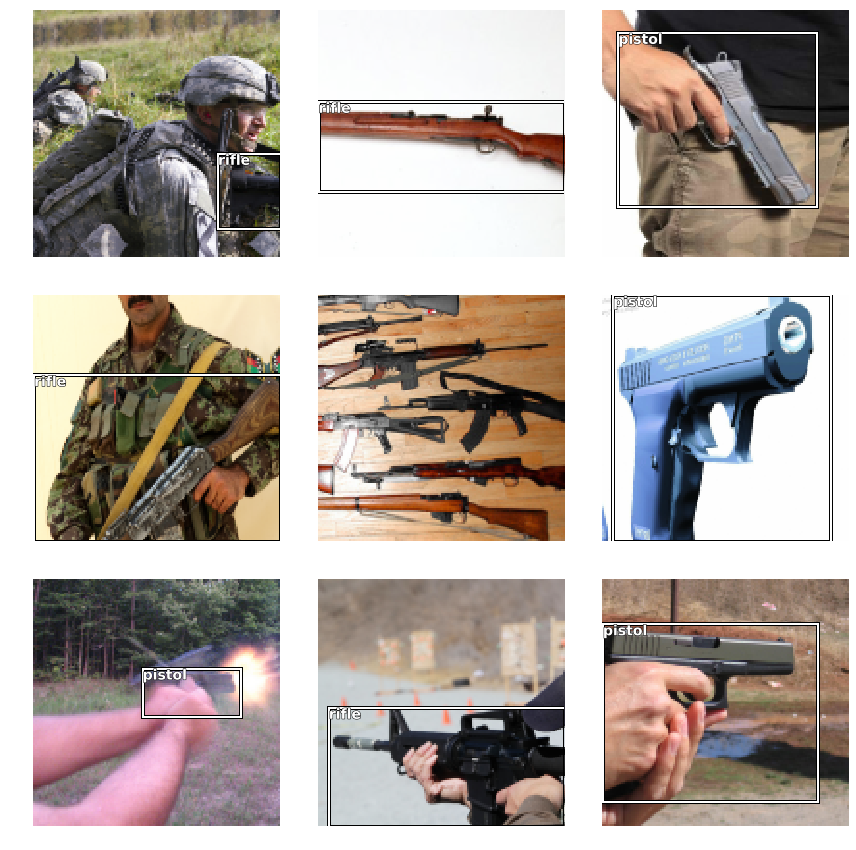

In [0]:
data.show_batch(rows=3)

In [0]:
encoder = create_body(models.resnet50, cut=-2)
model = RetinaNet(encoder, data.c, final_bias=-4)
crit = RetinaNetFocalLoss(scales=scales, ratios=ratios)
learn = Learner(data, model, loss_func=crit)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.torch/models/resnet50-19c8e357.pth
102502400it [00:04, 21406172.07it/s]


In [0]:
def retina_net_split(model):
    groups = [list(model.encoder.children())[:6], list(model.encoder.children())[6:]]
    return groups + [list(model.children())[1:]]

In [0]:
learn = learn.split(retina_net_split)

In [0]:
learn.freeze()

In [0]:
learn.save('stage-0')

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


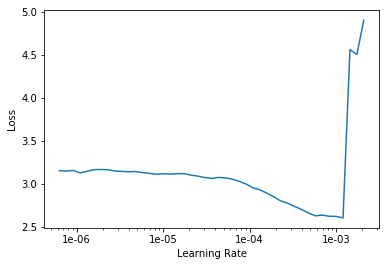

In [0]:
learn.recorder.plot()

In [0]:
learn=learn.load('stage-0')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
learn.fit_one_cycle(10,max_lr=(5e-4),pct_start=0.8)

epoch,train_loss,valid_loss,time
0,3.113738,2.947433,00:11
1,3.003414,3.629227,00:11
2,2.809033,1.720491,00:11
3,2.611321,2.030356,00:10
4,2.506182,2.113188,00:10
5,2.422993,1.533950,00:11
6,2.297719,1.684547,00:10
7,2.234999,1.791459,00:10
8,2.151420,1.525039,00:10
9,2.064016,1.578261,00:10


In [0]:
learn.fit_one_cycle(5,max_lr=(1e-4))

epoch,train_loss,valid_loss,time
0,1.418076,1.419477,00:10
1,1.488225,1.480743,00:09
2,1.454610,1.479671,00:09
3,1.439754,1.405822,00:09
4,1.430347,1.404958,00:10


In [0]:
learn.save('stage-1-128')

In [0]:
learn=learn.load('stage-1-128')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
learn.unfreeze()

In [0]:
learn.fit_one_cycle(5,max_lr=slice(1e-6,5e-5),wd=0.1)

epoch,train_loss,valid_loss,time
0,1.450060,1.413872,00:09
1,1.437988,1.394549,00:09
2,1.390089,1.364223,00:09
3,1.366186,1.351452,00:10
4,1.361446,1.361815,00:09


In [0]:
learn.save('stage-2-128')

In [0]:
learn=learn.load('stage-2-128')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
learn.data=get_data(32,192)

In [0]:
learn.freeze()
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


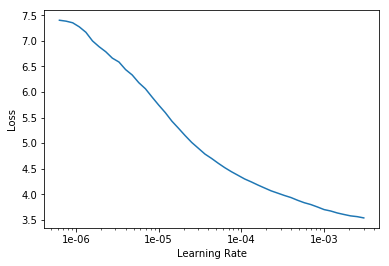

In [0]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(10,5e-4)

epoch,train_loss,valid_loss,time
0,2.915366,2.732038,00:13
1,2.588727,4.521185,00:12
2,2.580859,2.241369,00:12
3,2.357288,1.532585,00:12
4,2.108366,1.665433,00:12
5,1.971848,1.722075,00:13
6,1.873786,1.324711,00:12
7,1.747807,1.323572,00:12
8,1.652063,1.385675,00:12
9,1.577103,1.350568,00:13


In [0]:
learn.fit_one_cycle(5,1e-4)

epoch,train_loss,valid_loss,time
0,1.210659,1.233769,00:11
1,1.199638,1.225935,00:12
2,1.180504,1.360435,00:12
3,1.159522,1.247822,00:12
4,1.149170,1.237875,00:12


In [0]:
learn.save('stage-1-192')

In [0]:
learn=learn.load('stage-1-192')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
learn.unfreeze()

In [0]:
learn.fit_one_cycle(2,max_lr=slice(1e-6,5e-5),wd=0.1)

epoch,train_loss,valid_loss,time
0,1.110222,1.299825,00:12
1,1.100863,1.205927,00:12


In [0]:
learn.save('stage-2-192')

In [0]:
learn=learn.load('stage-2-192')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
learn.data=get_data(24,256)

In [0]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


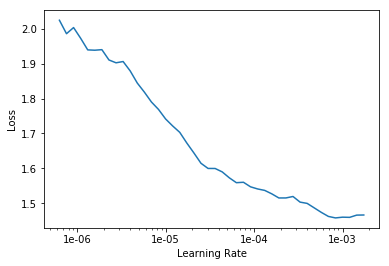

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(5,5e-4)

epoch,train_loss,valid_loss,time
0,1.393743,1.410709,00:18
1,1.365304,1.523104,00:17
2,1.330303,1.301431,00:18
3,1.279435,1.165700,00:18
4,1.211588,1.161442,00:17


In [0]:
learn.fit_one_cycle(3,5e-4)

epoch,train_loss,valid_loss,time
0,1.128153,2.004719,00:17
1,1.365883,1.303722,00:17
2,1.277135,1.149840,00:17


In [0]:
learn.save('stage-1-256')

In [0]:
learn=learn.load('stage-1-256')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


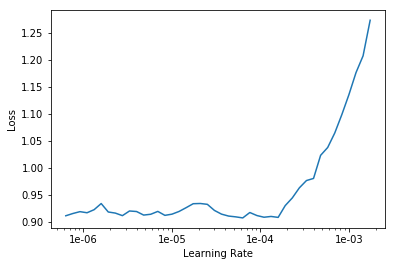

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(10,max_lr=slice(1e-5,5e-4),wd=0.1)

epoch,train_loss,valid_loss,time
0,1.045149,1.123798,00:18
1,1.020233,1.336145,00:19
2,1.079995,1.377943,00:19
3,1.079786,1.120823,00:18
4,1.068315,1.383513,00:18
5,1.044612,1.003217,00:18
6,0.986914,0.903324,00:19
7,0.889838,0.878416,00:19
8,0.817106,0.846339,00:19
9,0.763292,0.845615,00:18


In [0]:
learn.save('stage-2-256')

In [0]:
learn=learn.load('stage-2-256')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
path=Path('guns')
images_trn,lbl_bbox_trn=get_annotations(path/'difficult.json')
images_val,lbl_bbox_val=get_annotations(path/'valid.json')
images,lbl_bbox=images_trn+images_val,lbl_bbox_trn+lbl_bbox_val
img2bbox = dict(zip(images, lbl_bbox))
get_y_func = lambda o:img2bbox[o.name]

In [0]:
def get_data(bs, size):
    src = ObjectItemList.from_folder(path/'images_difficult')
    src =src.split_by_files(images_val)   
    src = src.label_from_func(get_y_func)
    src = src.transform(get_transforms(), size=size, tfm_y=True)
    return src.databunch(path=path, bs=bs, collate_fn=bb_pad_collate)

In [0]:
learn.data=get_data(8,512)

In [0]:
ratios = [1/2,1,2]
#scales = [1,2**(-1/3), 2**(-2/3)]
scales = [1,2**(1/3), 2**(2/3)] #for bigger size

In [0]:
crit = RetinaNetFocalLoss(scales=scales, ratios=ratios)
learn.loss_func=crit

In [0]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


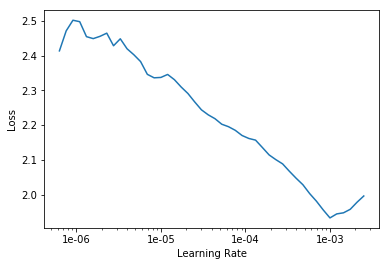

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(10,4e-5)

epoch,train_loss,valid_loss,time
0,2.024473,1.955247,01:34
1,1.667740,1.456667,01:31
2,1.383333,1.370971,01:31
3,1.226791,1.380384,01:31
4,1.154421,1.263393,01:31
5,1.074504,1.268851,01:31
6,1.002846,1.223292,01:31
7,0.968112,1.214928,01:31
8,0.941719,1.232663,01:31
9,0.946868,1.206364,01:31


In [0]:
learn.fit_one_cycle(3,4e-5)

epoch,train_loss,valid_loss,time
0,0.902782,1.164994,01:38
1,0.857049,1.281930,01:37
2,0.737625,1.076113,01:37


In [0]:
learn.save('stage-1-512')

In [0]:
learn=learn.load('stage-1-512')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
learn.fit_one_cycle(1,4e-5)

epoch,train_loss,valid_loss,time
0,0.692440,1.061668,01:38


In [0]:
learn.unfreeze()

In [0]:
learn.fit_one_cycle(5,max_lr=slice(1e-6,2e-5))

epoch,train_loss,valid_loss,time
0,0.639328,1.073154,01:38
1,0.606050,1.093849,01:37
2,0.605546,1.059387,01:37
3,0.584073,1.056379,01:37
4,0.579904,1.095479,01:38


In [0]:
learn.save('stage-2-512')

In [0]:
learn.load('stage-2-512')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


Learner(data=ImageDataBunch;

Train: LabelList (440 items)
x: ObjectItemList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ObjectCategoryList
ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512)
Path: guns/images_difficult;

Valid: LabelList (209 items)
x: ObjectItemList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ObjectCategoryList
ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512)
Path: guns/images_difficult;

Test: None, model=RetinaNet(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
     

In [0]:
L = compute_class_AP(learn.model, data.valid_dl, data.c-1)

In [0]:
for ap,cl in zip(L, data.classes[1:]): print(f'{cl}: {ap:.6f}')

pistol: 0.521836
rifle: 0.065556


In [0]:
learn=learn.load('stage-2-128')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


FileNotFoundError: ignored

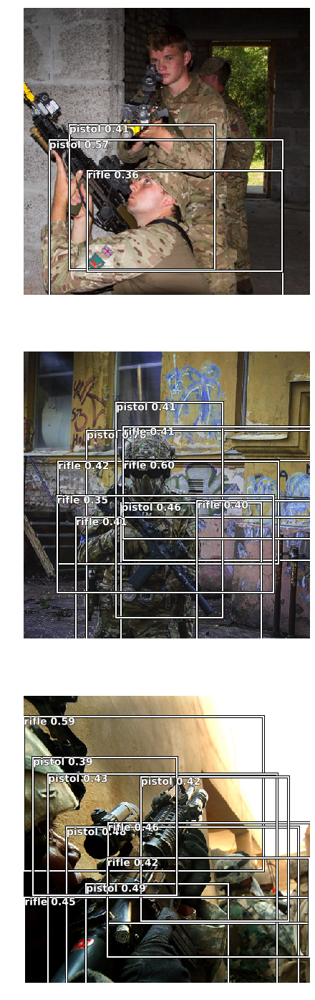

In [0]:
show_results(learn,start=0)

In [0]:
learn=learn.load('stage-2-192')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


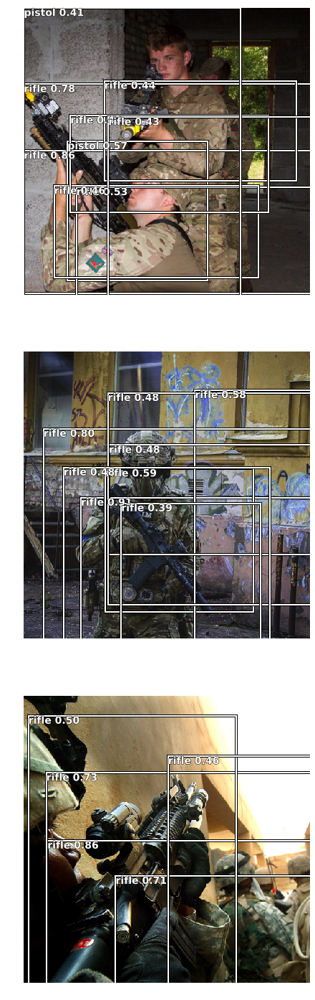

In [0]:
show_results(learn,start=0)

In [0]:
learn=learn.load('stage-2-256')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


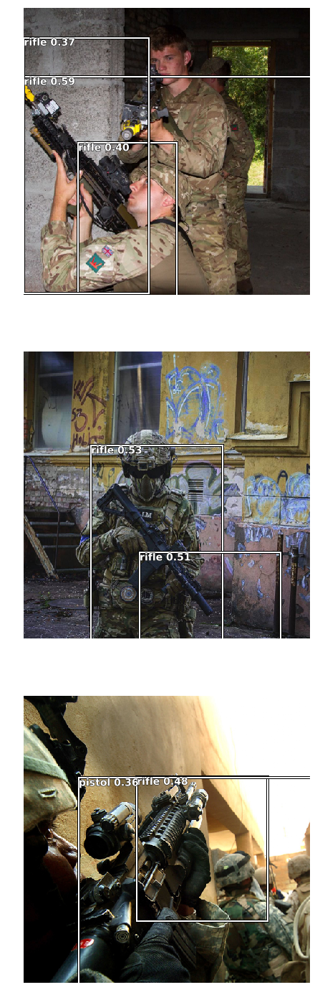

In [0]:
show_results(learn,start=0)

In [0]:
learn=learn.load('stage-2-512')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


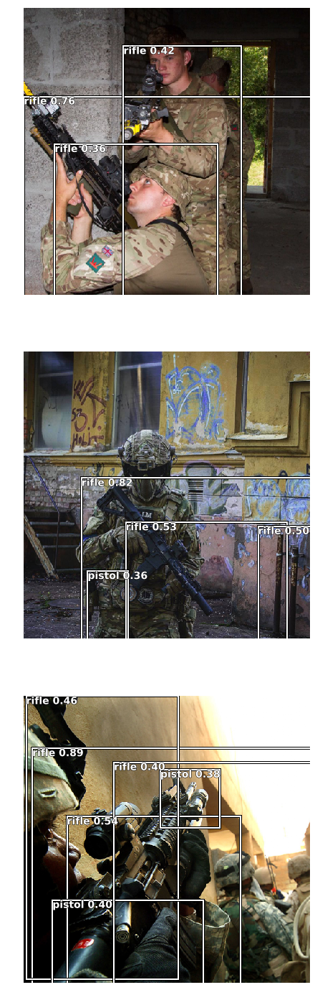

In [0]:
show_results(learn,start=0)

In [0]:
!pip install -U -q PyDrive
zip_id = '1NWqTks45cnrYdX1z1zYLfMsRIkSn5tEo'
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import zipfile, os
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)
# DOWNLOAD ZIP
print ("Downloading zip file")
myzip = drive.CreateFile({'id': zip_id})
myzip.GetContentFile('stage-2-512.pth')

     |████████████████████████████████| 993kB 3.4MB/s 


In [0]:
!mv stage-2-512.pth guns/models/

In [0]:
learn=learn.load('stage-2-512')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type LateralUpsampleMerge. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNetFocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type RetinaNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


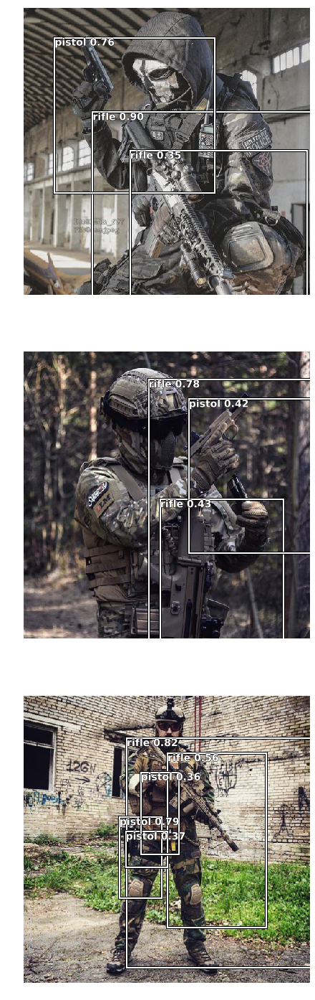

In [0]:
show_results(learn,start=0)

In [0]:
!rm -r sort

In [0]:
sort

<module 'sort.sort' from '/content/sort/sort.py'>

In [0]:
!git clone https://github.com/abewley/sort.git

Cloning into 'sort'...
remote: Enumerating objects: 135, done.
remote: Total 135 (delta 0), reused 0 (delta 0), pack-reused 135
Receiving objects: 100% (135/135), 1.19 MiB | 1.30 MiB/s, done.
Resolving deltas: 100% (46/46), done.


In [0]:
!pip install filterpy

In [0]:
import cv2

In [0]:
mot_tracker = Sort() 

NameError: ignored

In [0]:

import cv2
from IPython.display import clear_output

cmap = plt.get_cmap('tab20b')
colors = [cmap(i)[:3] for i in np.linspace(0, 1, 20)]

# initialize Sort object and video capture
from sort import *
vid = cv2.VideoCapture('Floyd Lawton shows Deadshot _ Suicide Squad (online-video-cutter.com).mp4')

In [0]:
ret, frame = vid.read()

In [0]:
c=0

In [0]:
ret, frame = vid.read()
cv2.imwrite(f'frame{c}.jpg',frame)
pilimg=open_image(f'frame{c}.jpg')
detections = learn.model(pilimg.data[None].cuda())
img = np.array(pilimg)
bbox_pred, scores, preds = process_output(detections, 0, detect_thresh=0.4)
# #     pad_x = max(img.shape[0] - img.shape[1], 0) * (img_size / max(img.shape))
# #     pad_y = max(img.shape[1] - img.shape[0], 0) * (img_size / max(img.shape))
# #     unpad_h = img_size - pad_y
# #     unpad_w = img_size - pad_x
if len(scores) != 0:
  to_keep = nms(bbox_pred, scores)
  bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()

In [0]:
t_sz = torch.Tensor([*pilimg.size])[None].float()
bbox_pred[:,:2] = bbox_pred[:,:2] - bbox_pred[:,2:]/2
bbox_pred[:,:2] = (bbox_pred[:,:2] + 1) * t_sz/2
bbox_pred[:,2:] = bbox_pred[:,2:] * t_sz
bbox_pred = bbox_pred.long()

In [0]:
tracked_objects = mot_tracker.update(np.append(bbox_pred,scores))

array([4.190000e+02, 9.460000e+02, 2.380000e+02, 2.650000e+02, 4.419526e-01])

In [0]:
vidObj=cv2.VideoCapture('Floyd Lawton shows Deadshot _ Suicide Squad (online-video-cutter.com).mp4')
c=1
s=1
pathOut = 'video.avi'
fps = 24.0
size=(512,512)
out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'DIVX'), fps, size)

In [0]:
!mkdir vid

In [0]:
vidObj = cv2.VideoCapture('videoplayback (online-video-cutter.com).mp4') 

	# Used as counter variable 
count = 0

	# checks whether frames were extracted 
success = 1

while success: 

		# vidObj object calls read 
		# function extract frames 
	success, image = vidObj.read() 

		# Saves the frames with frame-count 
	cv2.imwrite('ame%d.jpg' % count, image) 

	count += 1

In [0]:
ct = CentroidTracker()
(H, W) = (None, None)

In [0]:
a=0

In [0]:
count

2501

In [0]:
k=0

In [0]:
for _ in range(2500):
    frame= cv2.imread(f'ame{a}.jpg')
    #cv2.imwrite(f'frame{c}.jpg',frame)
    im=open_image(f'ame{a}.jpg')
    a+=1
    if W is None or H is None:
      (H, W) =im.shape[:2]
    output=learn.model((im.data[None]).cuda())
    bbox_pred, scores, preds = process_output(output, 0, detect_thresh=0.5)
    if len(scores) != 0:
        to_keep = nms(bbox_pred, scores)
        bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()
        t_sz = torch.Tensor([*im.size])[None].float()
        bbox_pred[:,:2] = bbox_pred[:,:2] - bbox_pred[:,2:]/2
        bbox_pred[:,:2] = (bbox_pred[:,:2] + 1) * t_sz/2
        bbox_pred[:,2:] = bbox_pred[:,2:] * t_sz
        bbox_pred = bbox_pred.long()
        for bbox, c, scr in zip(bbox_pred, preds, scores):
          txt = str(c.item()) if data.classes is None else data.classes[c.item()+1]
          text=f'{txt} {scr:.2f}'
          cv2.rectangle(frame,(bbox[1], bbox[0]), (bbox[3]+bbox[1]-1, bbox[2]+bbox[0]-1),(0,255,0),2)
          cv2.putText(frame,text, (bbox[1],bbox[0]),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
          b0=bbox[1]
          b1=bbox[0]
          b2=bbox[3]+bbox[1]-1
          b3=bbox[2]+bbox[0]-1
          bbox[0]=b0
          bbox[1]=b1
          bbox[2]=b2
          bbox[3]=b3
        objects = ct.update(bbox_pred)
        for (objectID, centroid) in objects.items():
          text = "ID {}".format(objectID)
          cv2.putText(frame, text, (centroid[0] - 10, centroid[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
          cv2.circle(frame, (centroid[0], centroid[1]), 4, (0, 255, 0), -1)
    height, width, layers = frame.shape
    size = (width,height)
    cv2.imwrite(f'bb{a}.jpg',frame)
  
        

In [0]:
a

2501

In [0]:
c=0

In [0]:
pathOut='bean.avi'
out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'DIVX'), 24.0, size)
for i in range(0,2500):
    # writing to a image array
    frame=cv2.imread(f'bb{i}.jpg')
    out.write(frame)
out.release()

In [0]:
from scipy.spatial import distance as dist
from collections import OrderedDict
import numpy as np
 
class CentroidTracker():
  def __init__(self, maxDisappeared=50):
		# initialize the next unique object ID along with two ordered
		# dictionaries used to keep track of mapping a given object
		# ID to its centroid and number of consecutive frames it has
		# been marked as "disappeared", respectively
    self.nextObjectID = 0
    self.objects = OrderedDict()
    self.disappeared = OrderedDict()
 
		# store the number of maximum consecutive frames a given
		# object is allowed to be marked as "disappeared" until we
		# need to deregister the object from tracking
    self.maxDisappeared = maxDisappeared
  def register(self, centroid):
		# when registering an object we use the next available object
		# ID to store the centroid
    self.objects[self.nextObjectID] = centroid
    self.disappeared[self.nextObjectID] = 0
    self.nextObjectID += 1
  def deregister(self, objectID):
		# to deregister an object ID we delete the object ID from
		# both of our respective dictionaries
    del self.objects[objectID]
    del self.disappeared[objectID]
  def update(self, rects):
		# check to see if the list of input bounding box rectangles
		# is empty
    if len(rects) == 0:
			# loop over any existing tracked objects and mark them
			# as disappeared
      for objectID in self.disappeared.keys():
        self.disappeared[objectID] += 1
 
				# if we have reached a maximum number of consecutive
				# frames where a given object has been marked as
				# missing, deregister it
        if self.disappeared[objectID] > self.maxDisappeared:
          self.deregister(objectID)
 
			# return early as there are no centroids or tracking info
			# to update
      return self.objects

		# initialize an array of input centroids for the current frame
    inputCentroids = np.zeros((len(rects), 2), dtype="int")
 
		# loop over the bounding box rectangles
    for (i, (startX, startY, endX, endY)) in enumerate(rects):
			# use the bounding box coordinates to derive the centroid
      cX = int((startX + endX) / 2.0)
      cY = int((startY + endY) / 2.0)
      inputCentroids[i] = (cX, cY)
		# if we are currently not tracking any objects take the input
		# centroids and register each of them
    if len(self.objects) == 0:
      for i in range(0, len(inputCentroids)):
        self.register(inputCentroids[i])
		# otherwise, are are currently tracking objects so we need to
		# try to match the input centroids to existing object
		# centroids
    else:
			# grab the set of object IDs and corresponding centroids
      objectIDs = list(self.objects.keys())
      objectCentroids = list(self.objects.values())
 
			# compute the distance between each pair of object
			# centroids and input centroids, respectively -- our
			# goal will be to match an input centroid to an existing
			# object centroid
      D = dist.cdist(np.array(objectCentroids), inputCentroids)
 
			# in order to perform this matching we must (1) find the
			# smallest value in each row and then (2) sort the row
			# indexes based on their minimum values so that the row
			# with the smallest value is at the *front* of the index
			# list
      rows = D.min(axis=1).argsort()
 
			# next, we perform a similar process on the columns by
			# finding the smallest value in each column and then
			# sorting using the previously computed row index list
      cols = D.argmin(axis=1)[rows]
			# in order to determine if we need to update, register,
			# or deregister an object we need to keep track of which
			# of the rows and column indexes we have already examined
      usedRows = set()
      usedCols = set()
 
			# loop over the combination of the (row, column) index
			# tuples
      for (row, col) in zip(rows, cols):
				# if we have already examined either the row or
				# column value before, ignore it
				# val
        if row in usedRows or col in usedCols:
          continue
 
				# otherwise, grab the object ID for the current row,
				# set its new centroid, and reset the disappeared
				# counter
        objectID = objectIDs[row]
        self.objects[objectID] = inputCentroids[col]
        self.disappeared[objectID] = 0
 
				# indicate that we have examined each of the row and
				# column indexes, respectively
        usedRows.add(row)
        usedCols.add(col)
			# compute both the row and column index we have NOT yet
			# examined
      unusedRows = set(range(0, D.shape[0])).difference(usedRows)
      unusedCols = set(range(0, D.shape[1])).difference(usedCols)
			# in the event that the number of object centroids is
			# equal or greater than the number of input centroids
			# we need to check and see if some of these objects have
			# potentially disappeared
      if D.shape[0] >= D.shape[1]:
				# loop over the unused row indexes
        for row in unusedRows:
					# grab the object ID for the corresponding row
					# index and increment the disappeared counter
          objectID = objectIDs[row]
          self.disappeared[objectID] += 1
 
					# check to see if the number of consecutive
					# frames the object has been marked "disappeared"
					# for warrants deregistering the object
          if self.disappeared[objectID] > self.maxDisappeared:
            self.deregister(objectID)
			# otherwise, if the number of input centroids is greater
			# than the number of existing object centroids we need to
			# register each new input centroid as a trackable object
      else:
        for col in unusedCols:
          self.register(inputCentroids[col])
 
		# return the set of trackable objects
    return self.objects

In [0]:
from google.colab.patches import cv2_imshow



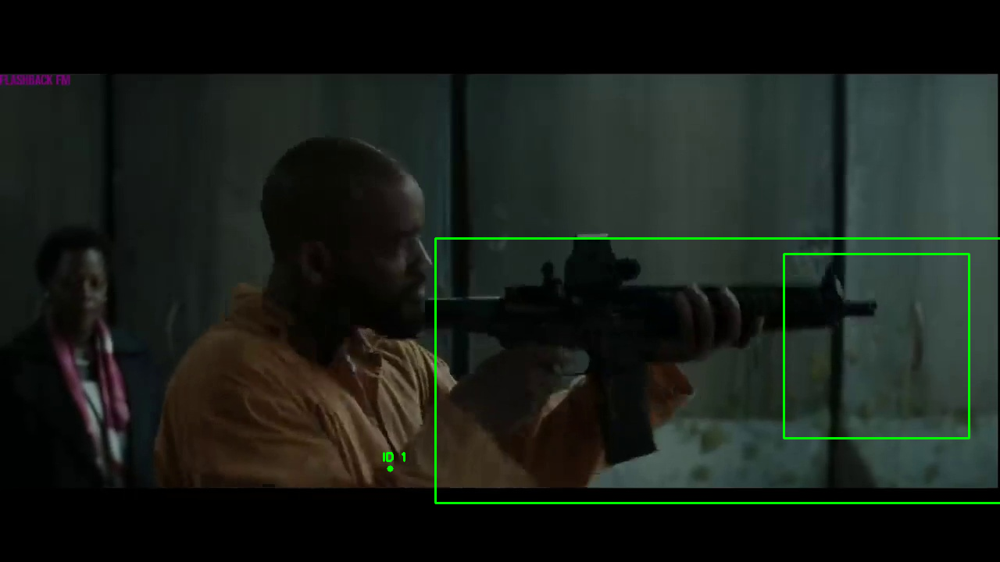

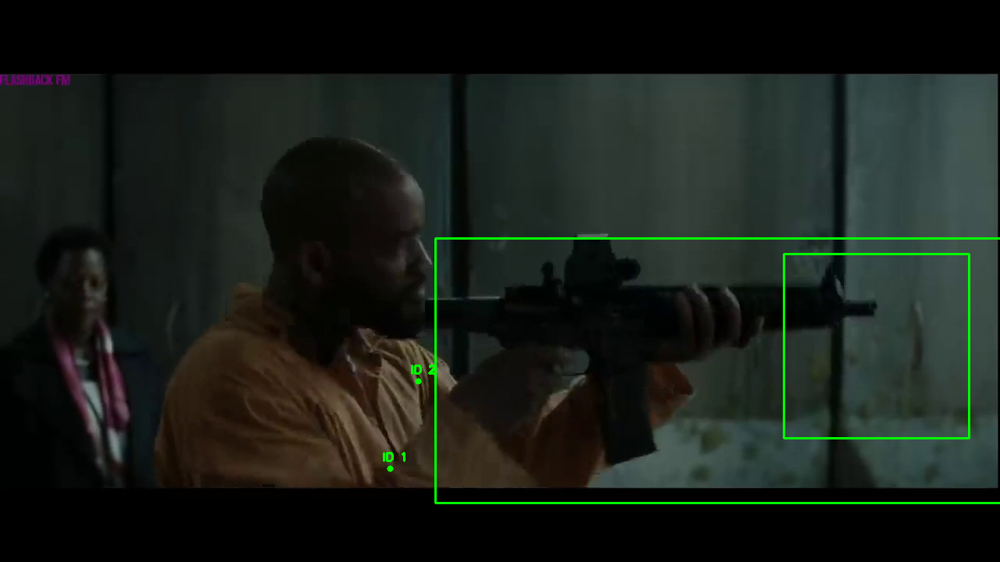

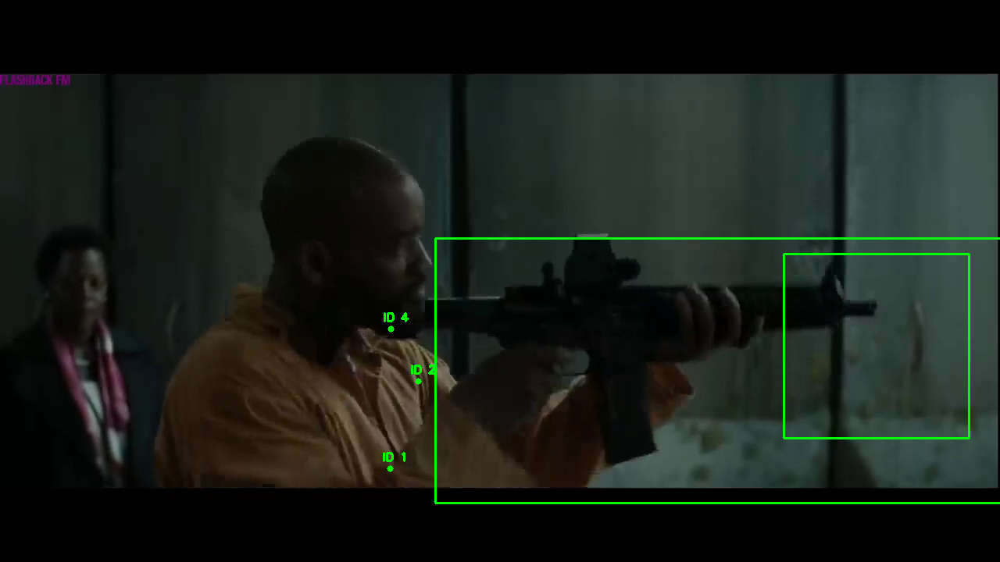

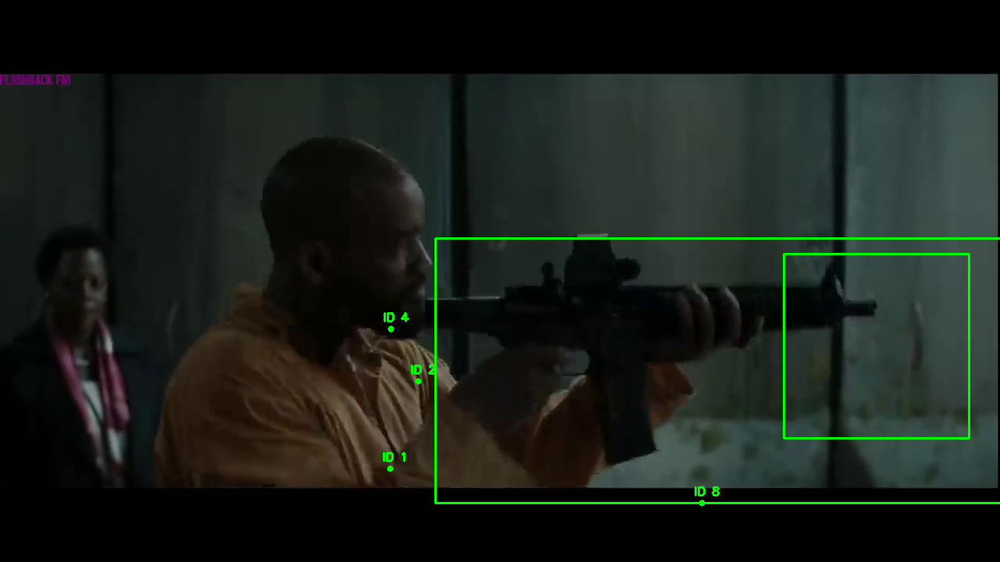

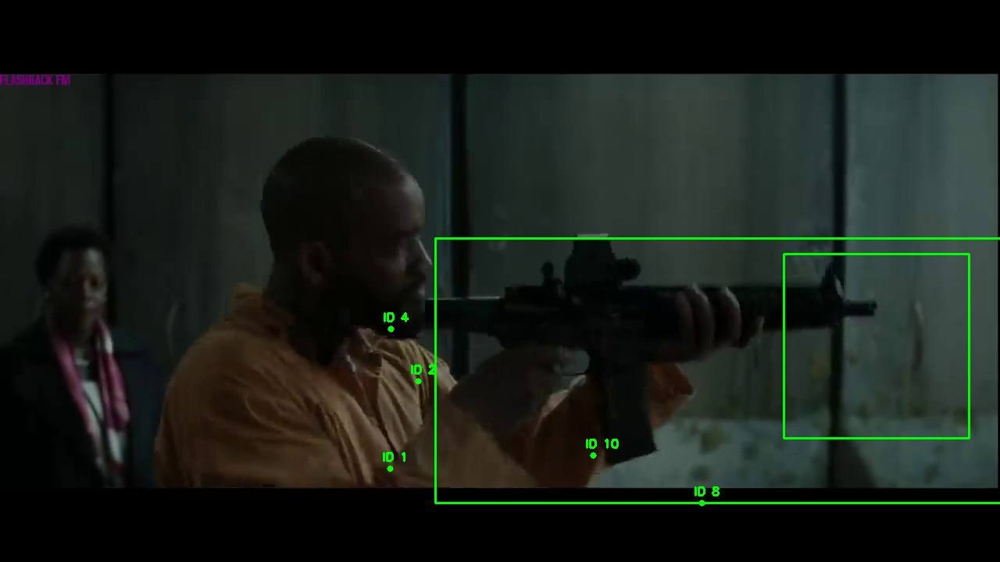

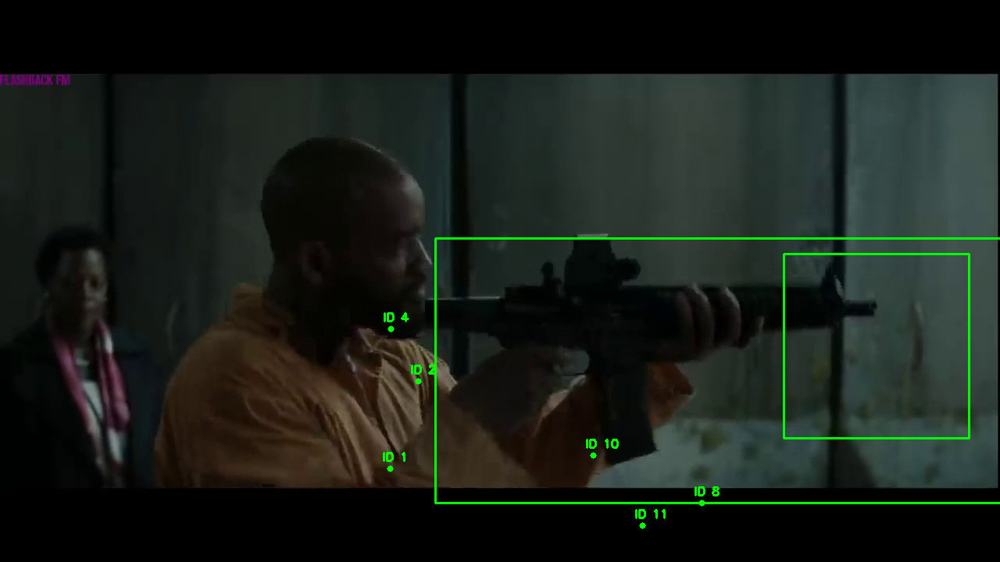

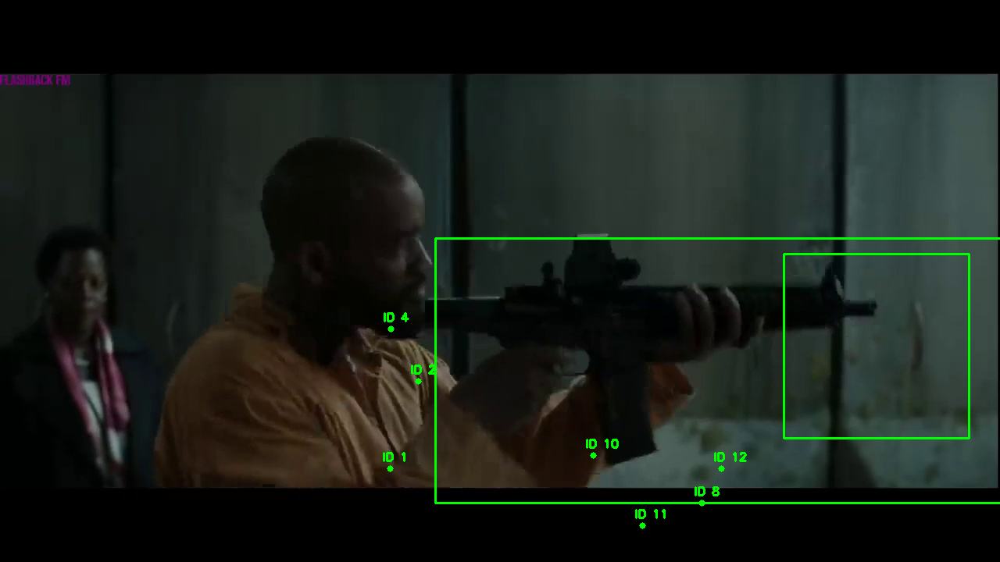

In [0]:
    frame= cv2.imread(f'f680.jpg') 
    im=open_image(f'f680.jpg')
    c+=1
    if W is None or H is None:
      (H, W) =im.shape[:2]
    output=learn.model((im.data[None]).cuda())
    bbox_pred, scores, preds = process_output(output, 0, detect_thresh=0.4)
    if len(scores) != 0:
        to_keep = nms(bbox_pred, scores)
        bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()
        t_sz = torch.Tensor([*im.size])[None].float()
        bbox_pred[:,:2] = bbox_pred[:,:2] - bbox_pred[:,2:]/2
        bbox_pred[:,:2] = (bbox_pred[:,:2] + 1) * t_sz/2
        bbox_pred[:,2:] = bbox_pred[:,2:] * t_sz
        bbox_pred = bbox_pred.long()
        for bbox in bbox_pred:
          cv2.rectangle(frame,(bbox[1], bbox[0]), (bbox[3]+bbox[1]-1, bbox[2]+bbox[0]-1),(0,255,0),2)
          b0=bbox[1]
          b1=bbox[0]
          b2=bbox[3]+bbox[1]-1
          b3=bbox[2]+bbox[0]-1
          bbox[0]=b0
          bbox[1]=b1
          bbox[2]=b2
          bbox[3]=b3
        objects = ct.update(bbox_pred)
        for (objectID, centroid) in objects.items():
          text = "ID {}".format(objectID)
          cv2.putText(frame, text, (centroid[0] - 10, centroid[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
          cv2.circle(frame, (centroid[0], centroid[1]), 4, (0, 255, 0), -1)
          cv2_imshow(frame)